In [1]:
import os
import subprocess
import json
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt


In [2]:
# same function from HW1 to download files, with some additional changes
group_num = 9
def download_files(group_num, folders = None, redownload = False):
    node_names = {}
    root_folder = f"Group{group_num}"
    root_folder_exist = os.path.exists(root_folder)
    if (not root_folder_exist) or redownload:
        os.system(f"rm -rf {root_folder}")
        os.mkdir(root_folder)
        if folders is None:
            folders = ['Facebook-Ego', 'Twitter-Ego']
        for folder in folders:
            os.mkdir(os.path.join(root_folder, folder))
            res = subprocess.run(["curl", "-s", f"https://api.github.com/repos/1250326/exercise_complex_network/contents/Datasets/Group{group_num}/{folder}"], stdout=subprocess.PIPE)
            for file_info in json.loads(res.stdout):
                os.system(f"wget -O {os.path.join(root_folder, folder, (fname:=file_info['name']))} {file_info['download_url']} -q")
                print(f"Downloaded file: {fname}")
                # if '.' in fname:
                    # node_names[folder.split('-')[0]] = fname.split('.')[0]
            print(f"Downloaded folder: {folder}")
    
        
    for folder in os.listdir(root_folder):
        for file in os.listdir(os.path.join(root_folder, folder)):
            if '.' in file:
                node_names[folder.split('-')[0]] = file.split('.')[0]
    return node_names

node_names = download_files(group_num, redownload=False)
node_names

{'Facebook': '3437_2', 'Twitter': '6408382'}

# A
Generate graphs based on Watts-Strogatz Model, and each of them should have the same number
of nodes as Facebook-Ego. Please generate 9 graphs with three different values of $\bar{k}$ and p. please
plot the graph structures, degree distributions, and clustering coefficients as well

In [3]:
facebook_net = nx.read_edgelist(f"Group{group_num}/Facebook-Ego/{node_names['Facebook']}.edges")
print(f"Number of nodes in facebook: {facebook_net.number_of_nodes()}")

Number of nodes in facebook: 132


0.5209621418860091

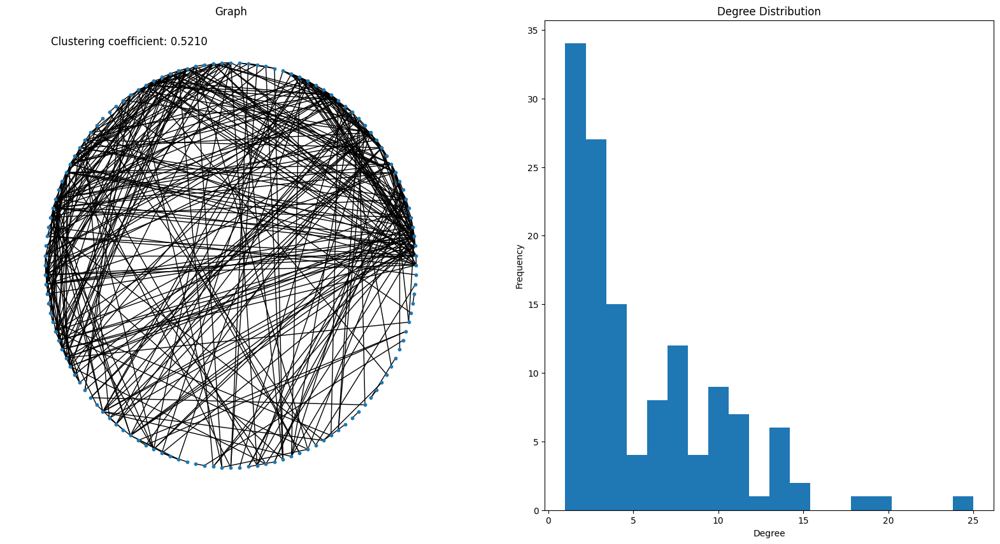

In [4]:
def explain_graph(graph, axes = None):
    if axes is None:
        _, axes = plt.subplots(1, 2, figsize=(20, 10))
    assert len(axes) == 2
    nx.draw_circular(graph, ax=axes[0], with_labels=False, node_size=10)
    axes[0].set_title("Graph")
    # axes[0].set_aspect('equal')
    axes[1].hist(dict(graph.degree()).values(), bins=20)
    axes[1].set_title("Degree Distribution")
    axes[1].set_xlabel("Degree")
    axes[1].set_ylabel("Frequency")
    axes[0].text(0.1, 0.95, f"Clustering coefficient: {(cc:=nx.average_clustering(graph,  count_zeros=True)):.4f}", fontsize=12, transform=axes[0].transAxes)
    # print(f"Clustering coefficient: {nx.average_clustering(graph,  count_zeros=False)}")
    return cc

explain_graph(facebook_net)

In [6]:
k_values = [2, 4, 6, 8]
p_values = [0, 0.5, 1]
plots_mat = [[None for _ in range(len(p_values)+1)] for _ in range(len(k_values)+1)]
for i in range(len(k_values)+1):
    for j in range(len(p_values)+1):
        match (i, j):
            case (0, 0):
                val = 'p/k'
            case (0, j):
                val = f'tp{j-1}'
            case (i, 0):
                val = f'tk{i-1}'
            case (i, j):
                val = [[f'gk{i-1}p{j-1}', f'hk{i-1}p{j-1}']]

        plots_mat[i][j] = val

plots_mat


[['p/k', 'tp0', 'tp1', 'tp2'],
 ['tk0', [['gk0p0', 'hk0p0']], [['gk0p1', 'hk0p1']], [['gk0p2', 'hk0p2']]],
 ['tk1', [['gk1p0', 'hk1p0']], [['gk1p1', 'hk1p1']], [['gk1p2', 'hk1p2']]],
 ['tk2', [['gk2p0', 'hk2p0']], [['gk2p1', 'hk2p1']], [['gk2p2', 'hk2p2']]],
 ['tk3', [['gk3p0', 'hk3p0']], [['gk3p1', 'hk3p1']], [['gk3p2', 'hk3p2']]]]

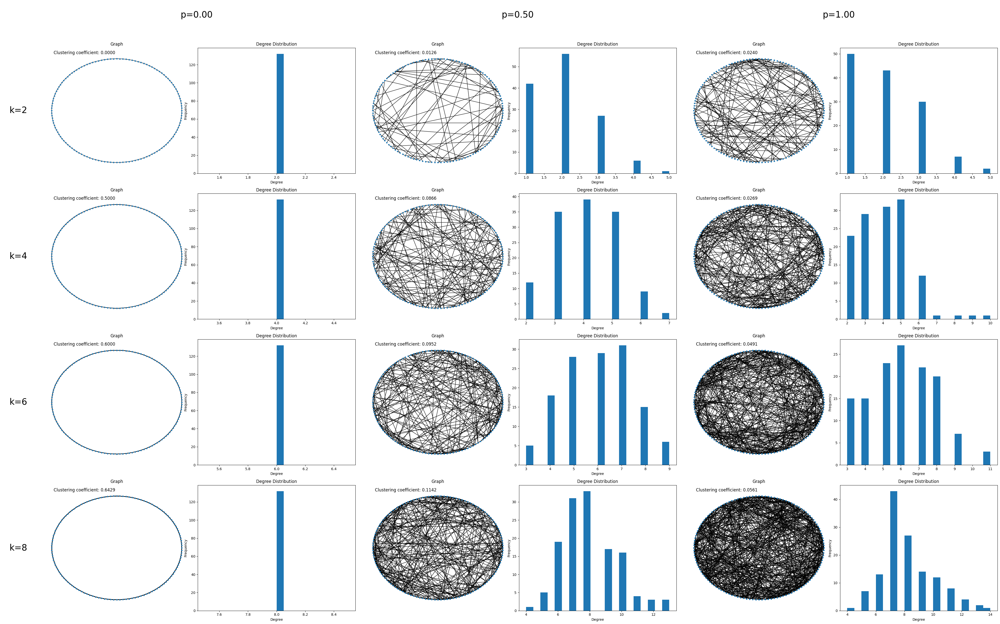

In [7]:
c = 5 # to change the overall image size, if you change it try to play with the font sizes to get the best result.
fig, axd = plt.subplot_mosaic(plots_mat, 
                              figsize=(2*c*(len(p_values)+1), c*(len(k_values)+1)), 
                              height_ratios=[1, *[5]*len(k_values)],
                              width_ratios=[1, *[10]*len(p_values)])
for i, p in enumerate(p_values):
    axd[f'tp{i}'].text(0.5, 0.5, f"p={p:.2f}", fontsize=25, transform=axd[f'tp{i}'].transAxes, ha='center', va='center')
    axd[f'tp{i}'].axis('off')
    # axd[f'tp{i}'].

for i, k in enumerate(k_values):
    axd[f'tk{i}'].text(0.5, 0.5, f"k={k}", fontsize=25, transform=axd[f'tk{i}'].transAxes, ha='center', va='center')
    axd[f'tk{i}'].axis('off')

axd['p/k'].axis('off')

clustring_coefficients = {}
for ki, k in enumerate(k_values):
    for pi, p in enumerate(p_values):
        g = nx.watts_strogatz_graph(facebook_net.number_of_nodes(), k, p)
        cc = explain_graph(g, [axd[f'gk{ki}p{pi}'], axd[f'hk{ki}p{pi}']])
        # axd[i, 0].set_ylabel(f"$\\bar{{k}}$={k}, p={p:.2f}")
        # axes[i, 0].axis('on')
        clustring_coefficients[(k, p)] = cc
        

plt.tight_layout()
plt.show()

    

In [8]:
clustring_coefficients

{(2, 0): 0.0,
 (2, 0.5): 0.012626262626262624,
 (2, 1): 0.023989898989898988,
 (4, 0): 0.5,
 (4, 0.5): 0.08658008658008653,
 (4, 1): 0.02691798941798942,
 (6, 0): 0.5999999999999996,
 (6, 0.5): 0.09522005772005762,
 (6, 1): 0.04913091958546502,
 (8, 0): 0.6428571428571429,
 (8, 0.5): 0.11421633921633915,
 (8, 1): 0.05613805386532657}

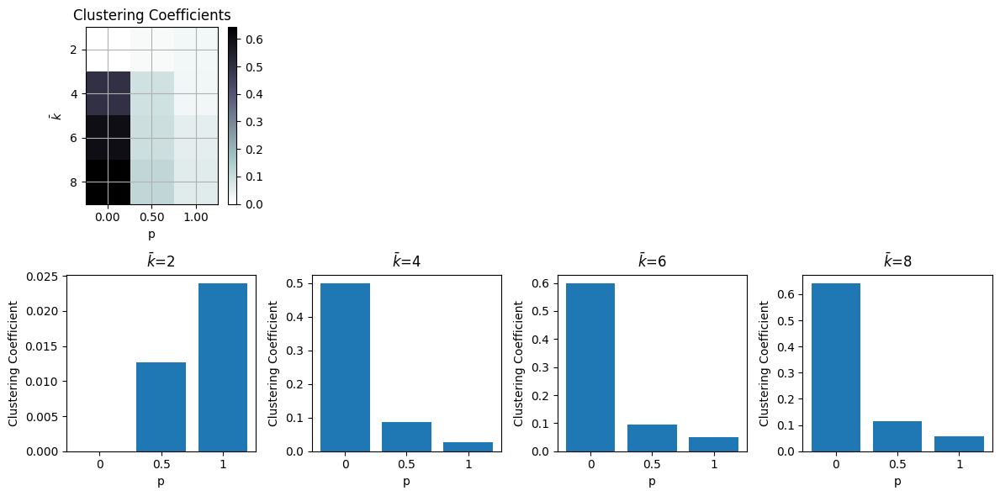

In [23]:
mat = np.zeros((len(k_values), len(p_values)))
p_value_reverse_mapping = {p:i for i, p in enumerate(p_values)}
k_value_reverse_mapping = {k:i for i, k in enumerate(k_values)}
for (k,p), cc in clustring_coefficients.items():
    mat[k_value_reverse_mapping[k], p_value_reverse_mapping[p]] = cc


c = 3
plt.figure(figsize=(c*len(k_values), 2*c))
plt.subplot(2,len(k_values), 1)
plt.imshow(mat, cmap='bone_r')
plt.colorbar()
plt.yticks(range(len(k_values)), k_values)
plt.xticks(range(len(p_values)), [f"{p:.2f}" for p in p_values])
plt.ylabel(r"$\bar{k}$")
plt.xlabel("p")
plt.grid(True)
plt.title("Clustering Coefficients")


for i, k in enumerate(k_values):
    plt.subplot(2, len(k_values), i+1+len(k_values))
    plt.bar(range(len(p_values)), mat[i])
    plt.xticks(range(len(p_values)), p_values)
    plt.xlabel("p")
    plt.ylabel("Clustering Coefficient")
    # for i, ((k,p), cc) in enumerate(clustring_coefficients.items()):
    #     if cc == 0: 
    #         cc = plt.ylim()[1]/2
    #     plt.text(i, cc*0.9, f"p={p:.2f}", ha='center', va='top', rotation=-90)
    # plt.ylabel("Clustering Coefficient")
    plt.title(f"$\\bar{{k}}$={k}")

plt.tight_layout()
plt.show()

let's pack every thing in a function for further usage

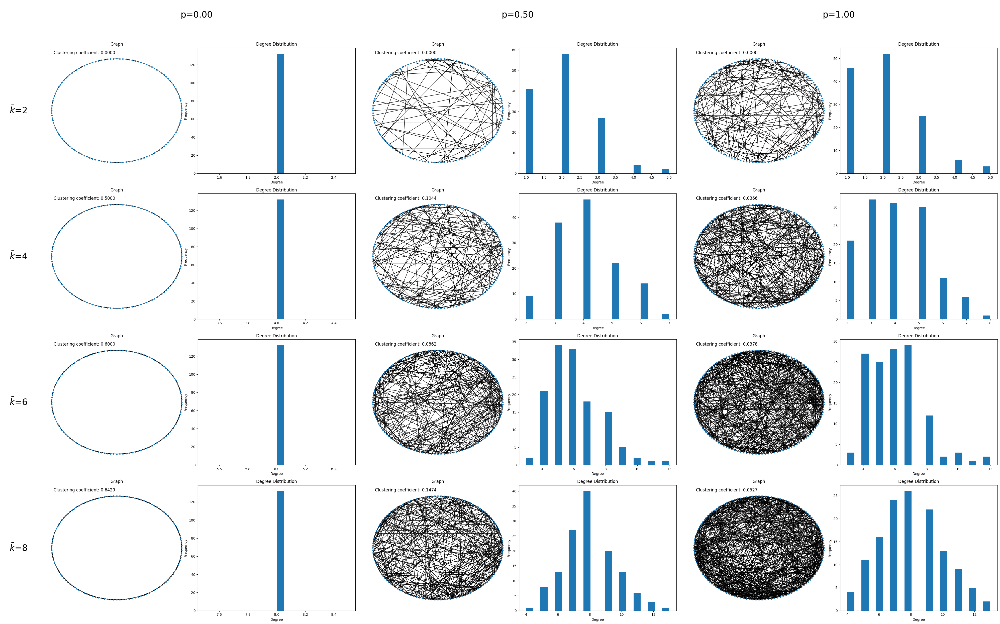

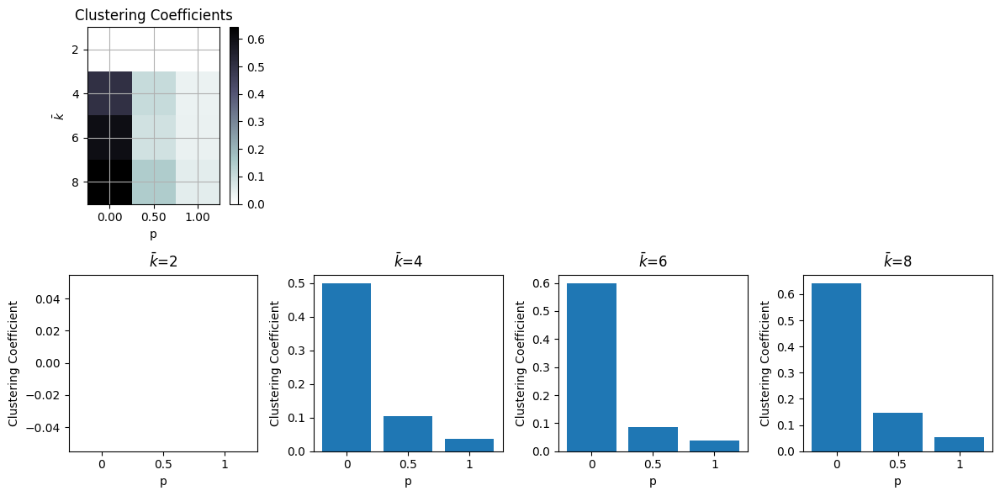

In [16]:
from typing import Callable

from matplotlib.pyplot import xlabel


def create_grid_explanation(x_values: list[float], y_values: list[float], function: Callable[[float, float], nx.Graph], x_label: str, y_label: str, c1=5, c2=3):
    """

    Args:
        x_values (list[float]): the values of rows
        y_values (list[float]): the values of columns
        function (callable[[float, float], nx.Graph]): the function that generates the graph, it should take two arguments, the first is the x value, and the second is the y
        c1 (int, optional): _description_. Defaults to 5.
        c2 (int, optional): _description_. Defaults to 3.
    """
    plots_mat = [[None for _ in range(len(y_values)+1)] for _ in range(len(x_values)+1)]
    for i in range(len(x_values)+1):
        for j in range(len(y_values)+1):
            match (i, j):
                case (0, 0):
                    val = 'x/y'
                case (0, j):
                    val = f'ty{j-1}'
                case (i, 0):
                    val = f'tx{i-1}'
                case (i, j):
                    val = [[f'gx{i-1}y{j-1}', f'hx{i-1}y{j-1}']]

            plots_mat[i][j] = val

    fig, axd = plt.subplot_mosaic(plots_mat, 
                                figsize=(2*c1*(len(y_values)+1), c1*(len(x_values)+1)), 
                                height_ratios=[1, *[5]*len(x_values)],
                                width_ratios=[1, *[10]*len(y_values)])
    for i, p in enumerate(y_values):
        axd[f'ty{i}'].text(0.5, 0.5, f"{y_label}={p:.2f}", fontsize=25, transform=axd[f'ty{i}'].transAxes, ha='center', va='center')
        axd[f'ty{i}'].axis('off')
        # axd[f'ty{i}'].

    for i, x in enumerate(x_values):
        axd[f'tx{i}'].text(0.5, 0.5, f"{x_label}={x}", fontsize=25, transform=axd[f'tx{i}'].transAxes, ha='center', va='center')
        axd[f'tx{i}'].axis('off')

    axd['x/y'].axis('off')

    clustring_coefficients = {}
    for ki, x in enumerate(x_values):
        for pi, y in enumerate(y_values):
            g = function(x,y)
            cc = explain_graph(g, [axd[f'gx{ki}y{pi}'], axd[f'hx{ki}y{pi}']])
            # axd[i, 0].set_ylabel(f"$\\bar{{x}}$={x}, p={p:.2f}")
            # axes[i, 0].axis('on')
            clustring_coefficients[(x, y)] = cc
            

    plt.tight_layout()
    plt.show()



    mat = np.zeros((len(x_values), len(y_values)))
    p_value_reverse_mapping = {y:i for i, y in enumerate(y_values)}
    k_value_reverse_mapping = {x:i for i, x in enumerate(x_values)}
    for (x,y), cc in clustring_coefficients.items():
        mat[k_value_reverse_mapping[x], p_value_reverse_mapping[y]] = cc


    c = 3
    plt.figure(figsize=(c2*len(x_values), 2*c2))
    plt.subplot(2,len(x_values), 1)
    plt.imshow(mat, cmap='bone_r')
    plt.colorbar()
    plt.yticks(range(len(x_values)), x_values)
    plt.xticks(range(len(y_values)), [f"{y:.2f}" for y in y_values])
    plt.ylabel(x_label)
    plt.xlabel(y_label)
    plt.grid(True)
    plt.title("Clustering Coefficients")


    for i, x in enumerate(x_values):
        plt.subplot(2, len(x_values), i+1+len(x_values))
        plt.bar(range(len(y_values)), mat[i])
        plt.xticks(range(len(y_values)), y_values)
        plt.xlabel(y_label)
        plt.ylabel("Clustering Coefficient")
        # for i, ((x,p), cc) in enumerate(clustring_coefficients.items()):
        #     if cc == 0: 
        #         cc = plt.ylim()[1]/2
        #     plt.text(i, cc*0.9, f"p={p:.2f}", ha='center', va='top', rotation=-90)
        # plt.ylabel("Clustering Coefficient")
        plt.title(f"{x_label}={x}")

    plt.tight_layout()
    plt.show()


create_grid_explanation([2, 4, 6, 8], [0, 0.5, 1], 
                        x_label=r"$\bar{k}$", y_label="p",
                        function=lambda x, y: nx.watts_strogatz_graph(facebook_net.number_of_nodes(), x, y))
    

# B
Generate scale-free graphs, and each of them should have the same number of nodes as Facebook-
Ego. Please generate 3 graphs with three different values of $\gamma$. Please plot the graph structures,
degree distributions, and clustering coefficients as well.

> NOTE: there is no specific function in the networkx library to generate scale-free graphs. 

avaliable options are:
- `nx.scale_free_graph`: the output is directed graph
- Barabasi-Albert Model: in this case, $\gamma \approx 3$
- Holme-Kim Model: accroding to the [paper](https://arxiv.org/pdf/cond-mat/0110452.pdf), it follows the *BA* model with $\gamma = 3$
- use `np.random.zipf` to generate the degree distribution and then generate the graph based on the degree distribution

In [15]:
gamma_values = np.linspace(2, 3, 3)
print(gamma_values)

[2.  2.5 3. ]


In [16]:
def scale_free_network(n, gamma):
    degree_sequence = np.random.zipf(gamma, n)
    # sum(degree_sequence) should be even
    if sum(degree_sequence) % 2 == 1:
        degree_sequence[0] += 1

    graph = nx.Graph(nx.configuration_model(degree_sequence))
    graph.remove_edges_from(nx.selfloop_edges(graph))
    return graph


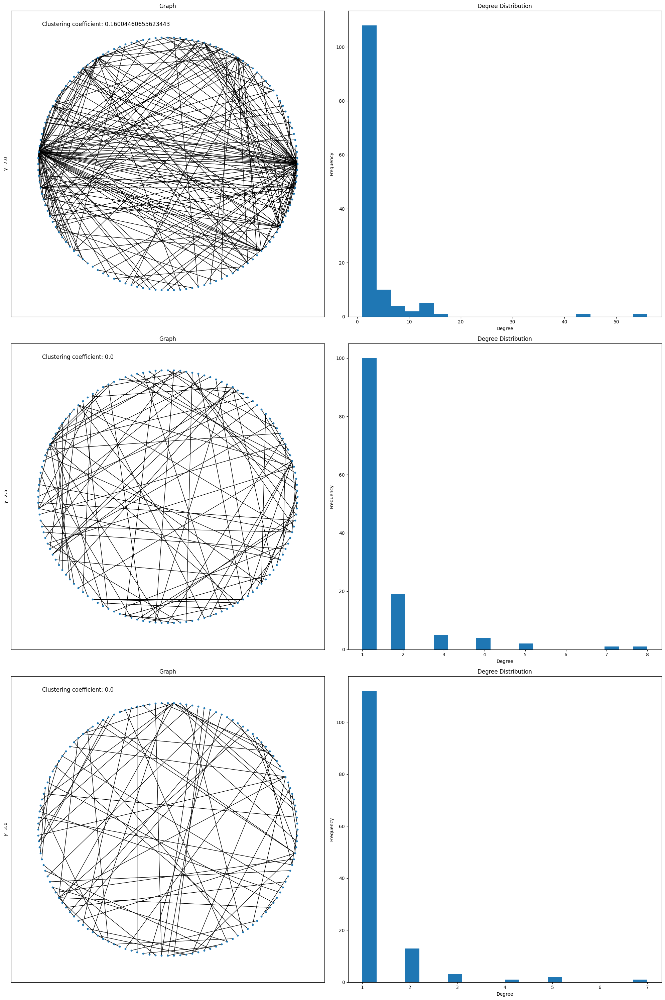

In [17]:
clustring_coefficients = []
fig, axes = plt.subplots(len(gamma_values), 2, figsize=(20, 10*len(gamma_values)))
for i, gamma in enumerate(gamma_values):
    g = scale_free_network(facebook_net.number_of_nodes(), gamma)
    cc = explain_graph(g, axes[i, :])
    axes[i, 0].set_ylabel(f"$\\gamma$={gamma}")
    axes[i, 0].axis('on')
    clustring_coefficients.append(cc)

plt.tight_layout()
plt.show()

# C

Generate graphs based on Barab ́asi-Albert Model, and each of them should have the same number
of nodes as Facebook-Ego. Please generate 9 graphs with three different values of $m_0$ and $m$.
Please plot the graph structures, degree distributions, and clustering coefficients as well

> Why we are using `nx.star_graph` to generate the initial graph? because in the source code of the `nx.barabasi_albert_graph` function, it uses the `nx.star_graph` to generate the initial graph (source code [here](https://github.com/networkx/networkx/blob/75f2af585b247962f2efe68b34b9819f18b444b1/networkx/generators/random_graphs.py#L707))

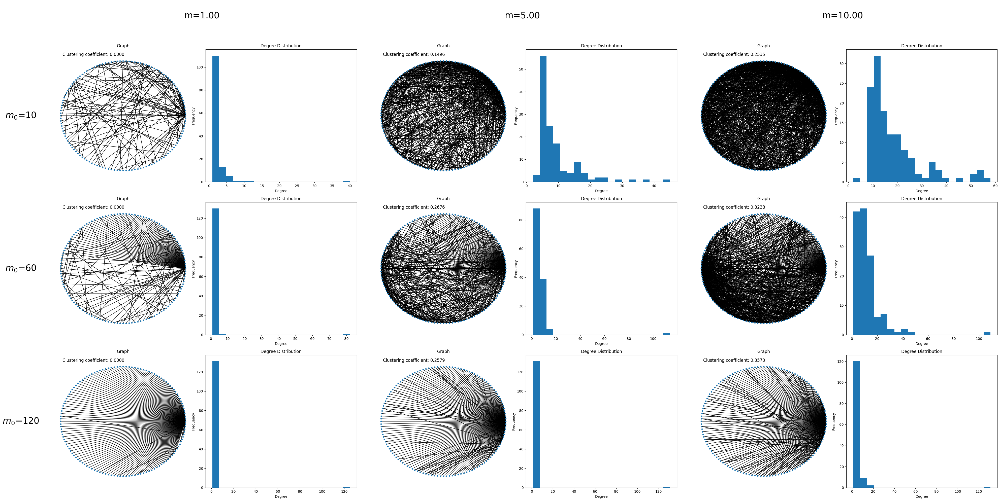

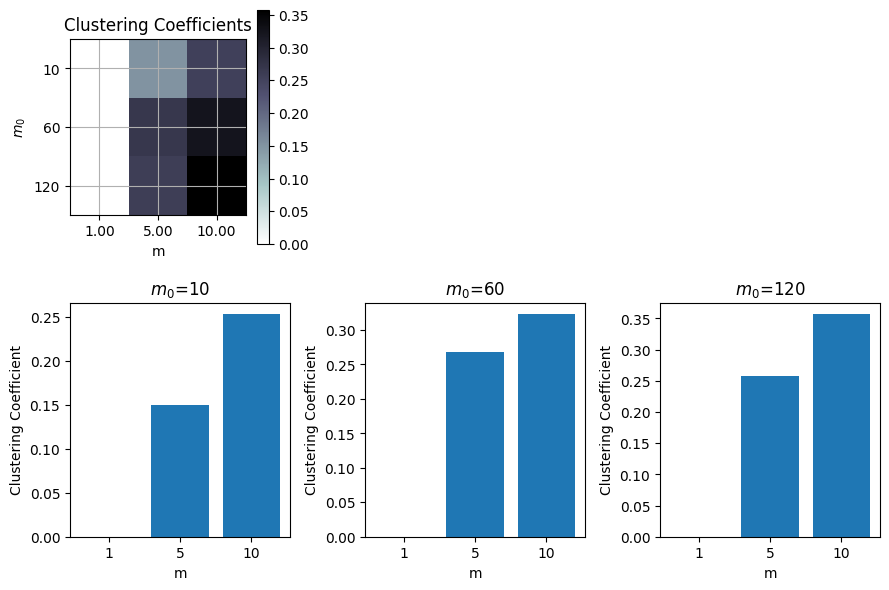

In [19]:
m0_values = [10, 60, 120]
m_values = [1, 5, 10]
create_grid_explanation(m0_values, m_values,
                        x_label=r"$m_0$", y_label="m",
                        function=lambda x, y: nx.barabasi_albert_graph(facebook_net.number_of_nodes(), m = y, initial_graph=nx.star_graph(x)))



# D
Please compare your Facebook-Ego network, Twitter-Ego network with the generated random
graphs in (a), (b) and (c). Which random graph(s) approximates your networks at most? Why?


0.5564741437734023

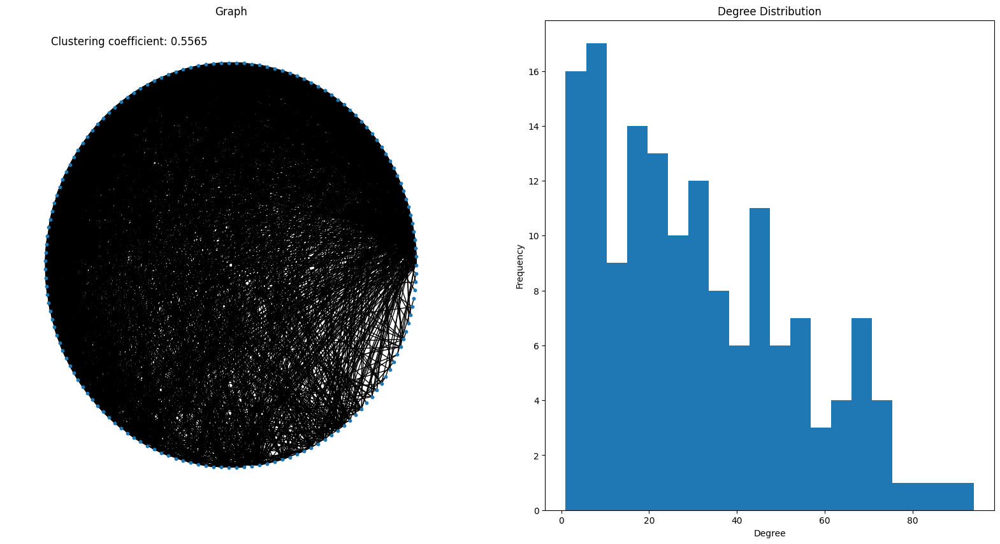

In [20]:
twitter_network = nx.read_edgelist(f"Group{group_num}/Twitter-Ego/{node_names['Twitter']}.edges")
explain_graph(twitter_network)

From a visual perspective, both the Facebook-Ego and Twitter-Ego networks exhibit similarities to scale-free networks. However, the degree distribution of the Facebook-Ego network aligns more closely with the Barabási-Albert model, specifically with parameters $m_0 = 60$ and $m = 10$. In contrast, the Twitter-Ego network shows a stronger resemblance to the Barabási-Albert model with $m_0 = 10$ and $m = 10$.
